<a href="https://colab.research.google.com/github/Kuladeep-2710/Coconut-Tree-Diseases-Detection-Using-YOLOV8-/blob/main/Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import cv2
from glob import glob
from tqdm import tqdm
import xml.etree.ElementTree as ET

In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 874.8/874.8 kB 37.4 MB/s eta 0:00:00


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="pjZtbsAzjhkBsKvruel1")
project = rf.workspace("mayhoc").project("coconut-tree-disease")
version = project.version(8)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.1 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Dependency ultralytics==8.0.196 is required but found version=8.2.102, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to coconut-tree-disease-8 in yolov8:: 100%|██████████| 4474/4474 [00:00<00:00, 5428.49it/s]


In [ ]:
data_path = "/content/coconut-tree-disease-8"
image_files = glob(os.path.join(data_path, "train", "images", "*.jpg"))
label_files = glob(os.path.join(data_path, "train", "labels", "*.txt"))
print(f"Number of images: {len(image_files)}")
print(f"Number of label files: {len(label_files)}")

Number of images: 1661
Number of label files: 1661


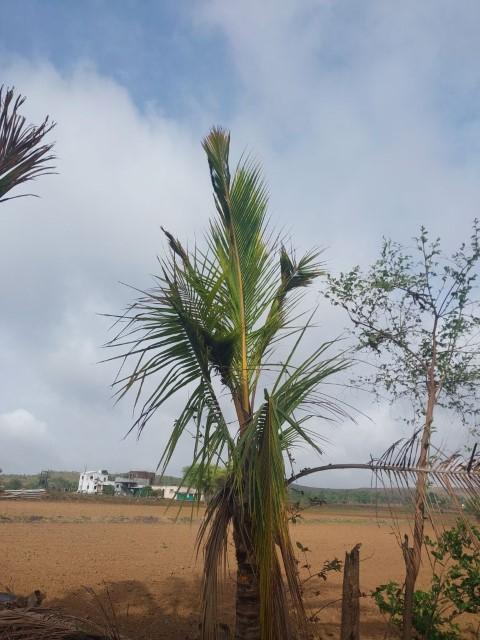

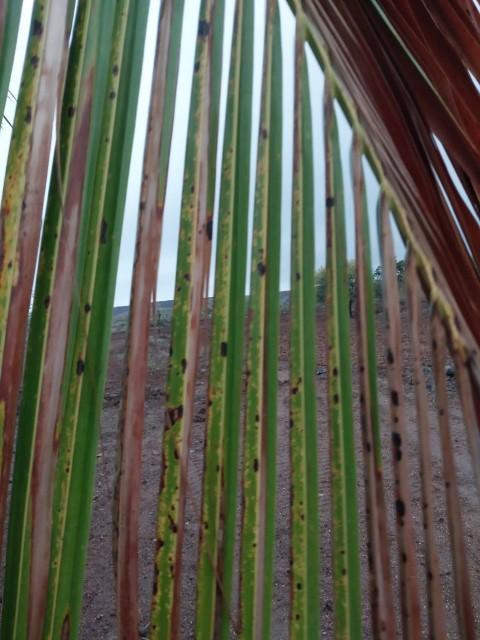

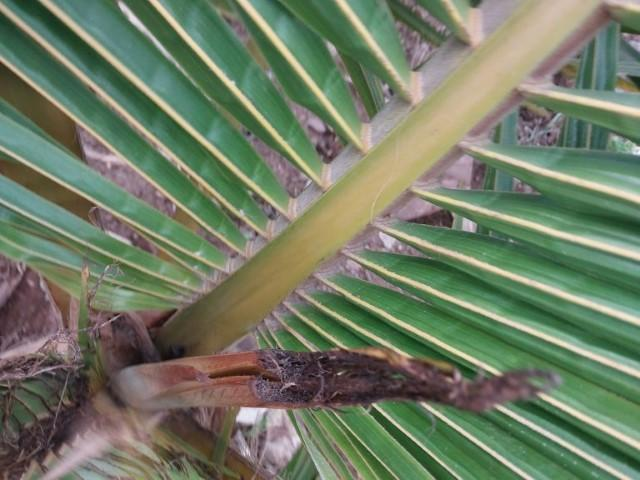

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/coconut-tree-disease-8/train/images/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
import glob
folder_path = '/content/coconut-tree-disease-8/train/images/'
image_files = glob.glob(folder_path + '*.jpg')
print(f"Number of images in the Train folder: {len(image_files)}")

Number of images in the Train folder: 1661


In [ ]:
import yaml
with open("/content/coconut-tree-disease-8/data.yaml") as stream:
    try:
        print(yaml.safe_load(stream))
    except yaml.YAMLError as exc:
        print(exc)

{'names': ['bud root dropping', 'bud rot', 'gray leaf spot', 'leaf rot', 'stembleeding'], 'nc': 5, 'roboflow': {'license': 'Public Domain', 'project': 'coconut-tree-disease', 'url': 'https://universe.roboflow.com/mayhoc/coconut-tree-disease/dataset/8', 'version': 8, 'workspace': 'mayhoc'}, 'test': '../test/images', 'train': 'coconut-tree-disease-8/train/images', 'val': 'coconut-tree-disease-8/valid/images'}


In [ ]:
def preprocess_image(image_path, target_size=(640, 640)):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    image = image / 255.0
    return image
preprocessed_images = [preprocess_image(img_path) for img_path in image_files[:10]]

In [ ]:
!nvidia-smi

Sat Sep 28 02:51:53 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 772, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are {'predict', 'val', 'train', 'benchmark', 'track', 'export'}.

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of {'pose', 'detect', 'obb', 'classify', 'segment'}
                MODE (required) is one of {'predict', 'val', 'train', 'benchmark', 'track', 'export'}
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at ht

In [ ]:
!pip install roboflow

In [ ]:
import os
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="eSzt9jqUwL3SzdHp0dmr")
project = rf.workspace("mayhoc").project("coconut-tree-disease")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.102, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to /content/datasets/coconut-tree-disease-1 in yolov8:: 100%|██████████| 1004/1004 [00:00<00:00, 2120.75it/s]


In [ ]:
!yolo task=detect mode=train model=yolov8n.pt data={dataset.location}/data.yaml epochs=50 imgsz=340

100% 6.25M/6.25M [00:00<00:00, 73.9MB/s]
Ultralytics YOLOv8.2.102 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/coconut-tree-disease-1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=340, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_co

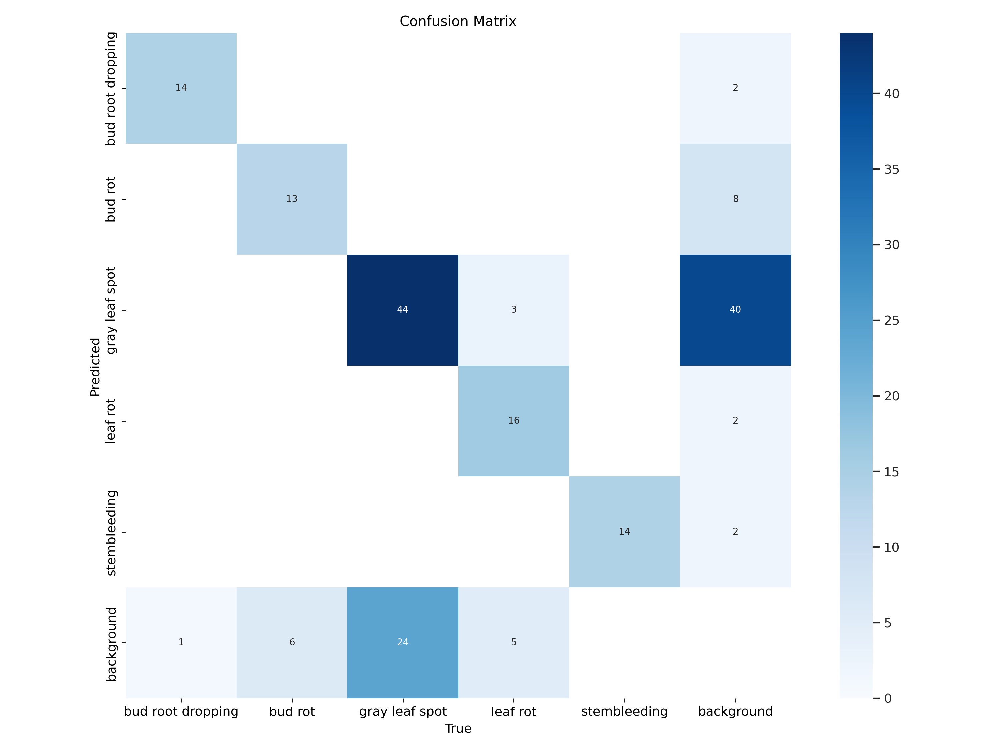

In [ ]:
from IPython.display import Image
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

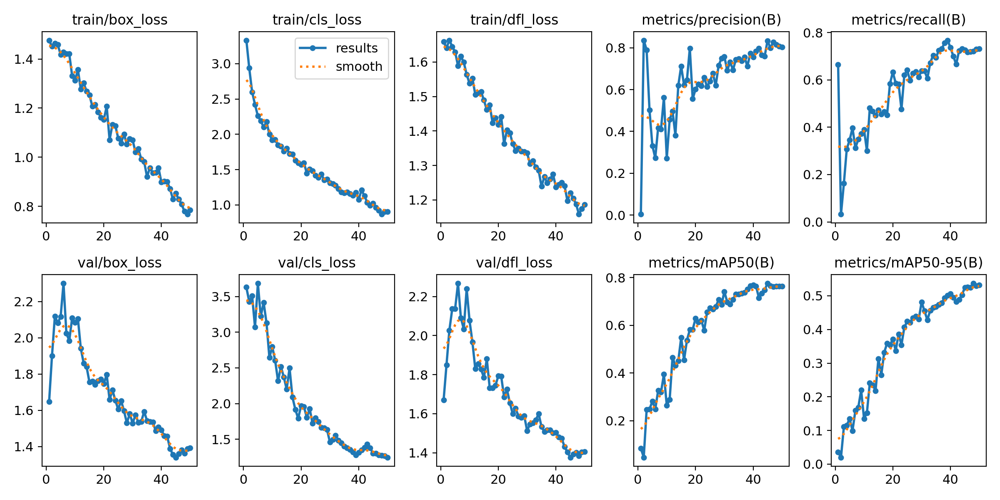

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png', width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.102 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/datasets/coconut-tree-disease-1/valid/labels.cache... 99 images, 0 backgrounds, 0 corrupt: 100% 99/99 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 85, len(boxes) = 140. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 7/7 [00:02<00:00,  3.06it/s]
                   all         99        140      0.815      0.722      0.764      0.534
     bud root dropping         15         15      0.893      0.933      0.985      0.894
               bud rot         13         19      0.718      0.536      0.603      0.359
        gray leaf spot     

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics YOLOv8.2.102 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

image 1/50 /content/datasets/coconut-tree-disease-1/test/images/BudRootDropping195_jpg.rf.ee3de958151c4b1e1aafa06a5cb35c3d.jpg: 352x352 1 bud root dropping, 7.7ms
image 2/50 /content/datasets/coconut-tree-disease-1/test/images/BudRootDropping209_jpg.rf.a663724627062f6cf2d8730d32ba6585.jpg: 352x352 1 bud root dropping, 10.2ms
image 3/50 /content/datasets/coconut-tree-disease-1/test/images/BudRootDropping261_jpg.rf.eda093b50944ad7d8b43439c9a91b271.jpg: 352x352 1 bud root dropping, 10.6ms
image 4/50 /content/datasets/coconut-tree-disease-1/test/images/BudRootDropping271_jpg.rf.3809ccda18c3777833899fe31ab29f49.jpg: 352x352 1 bud root dropping, 8.0ms
image 5/50 /content/datasets/coconut-tree-disease-1/test/images/BudRootDropping323_jpg.rf.25cb4eef0ddfec67cebc504d907a2acc.jpg: 352x352 1 bud root dropping, 11.8ms
image 6/50 /

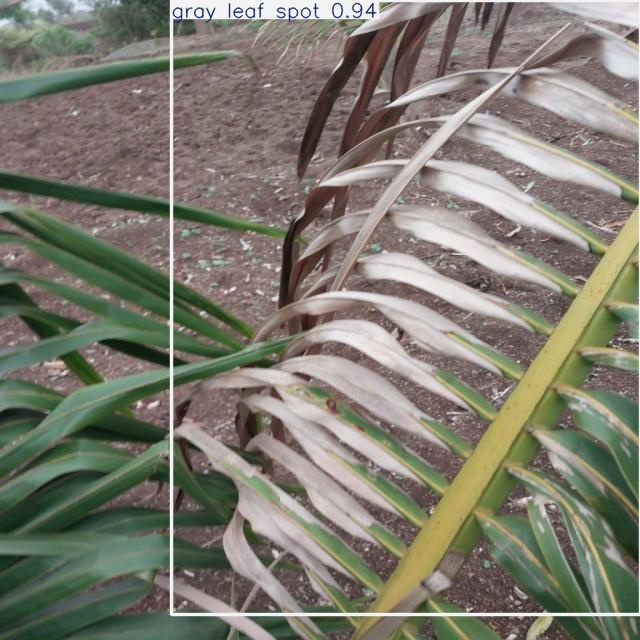

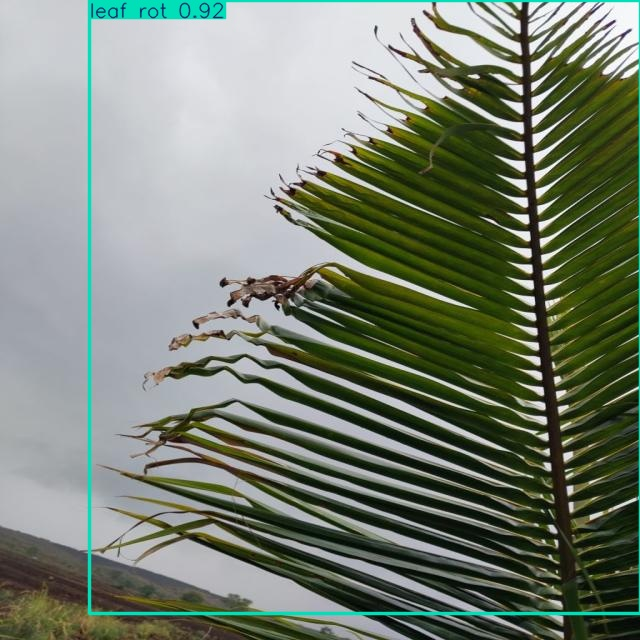

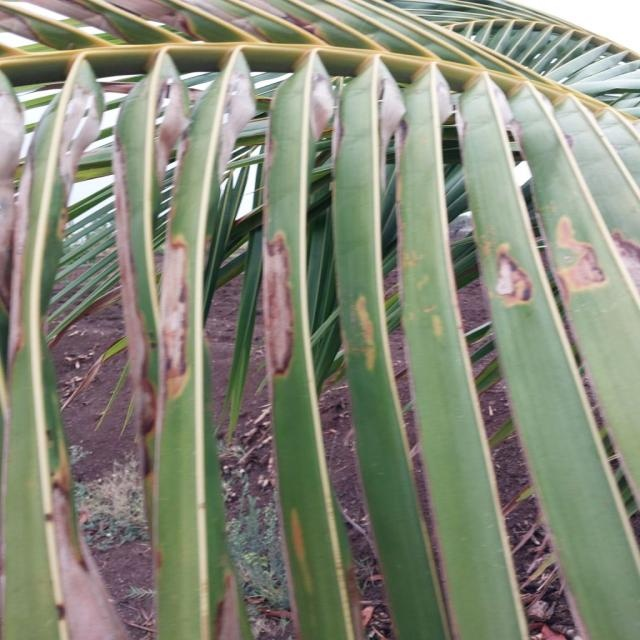

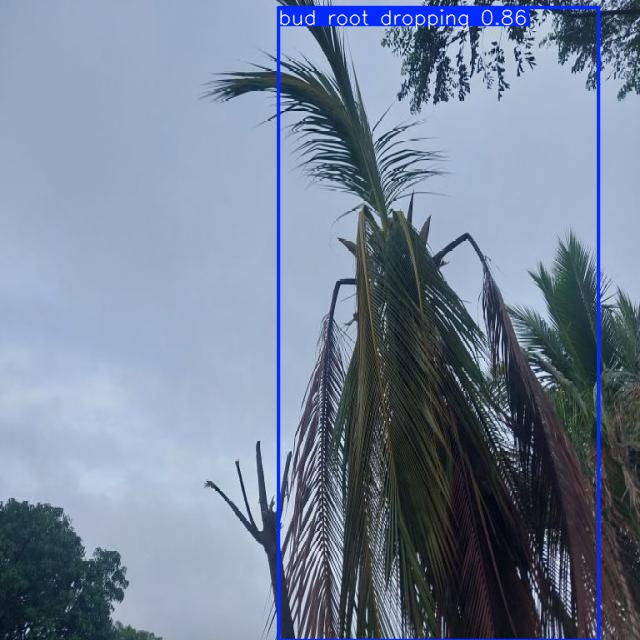

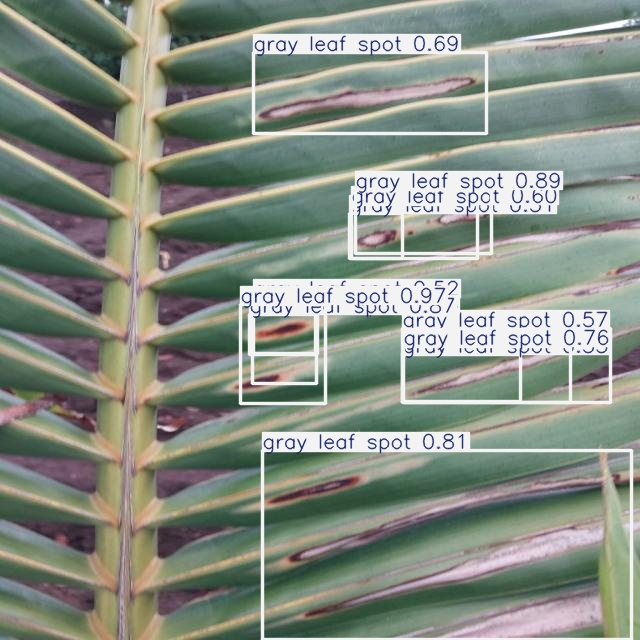

...

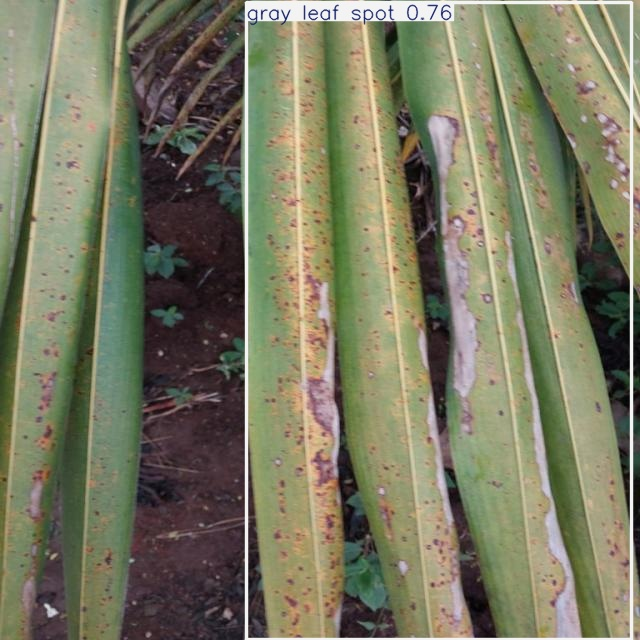

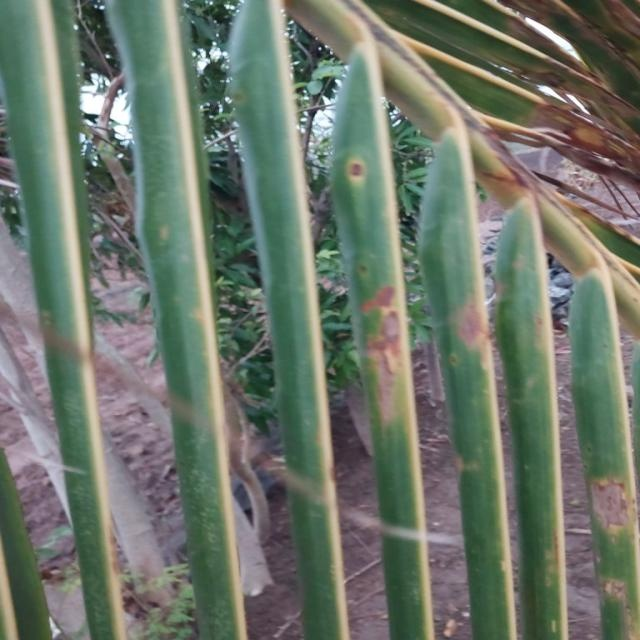

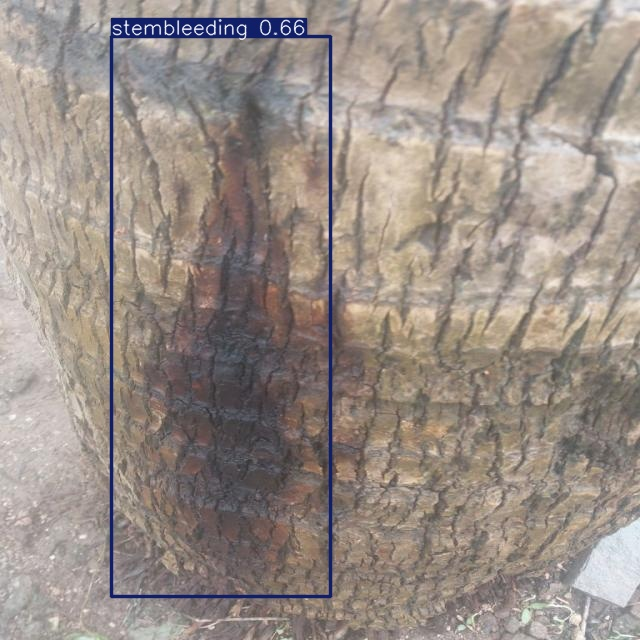

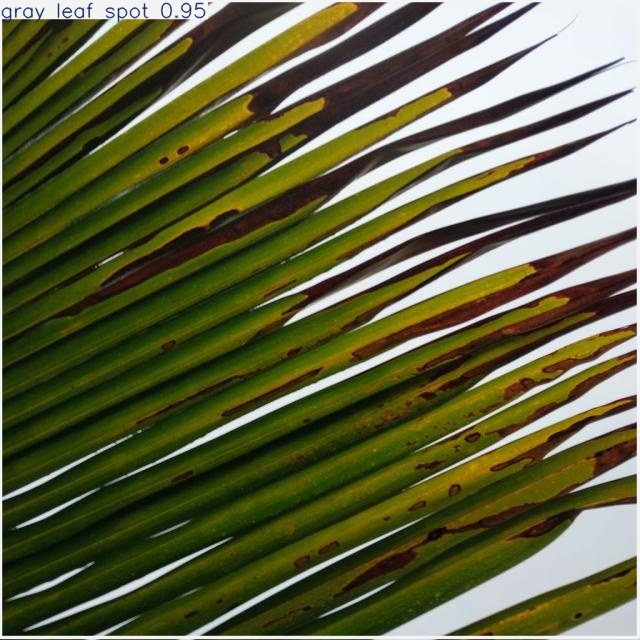

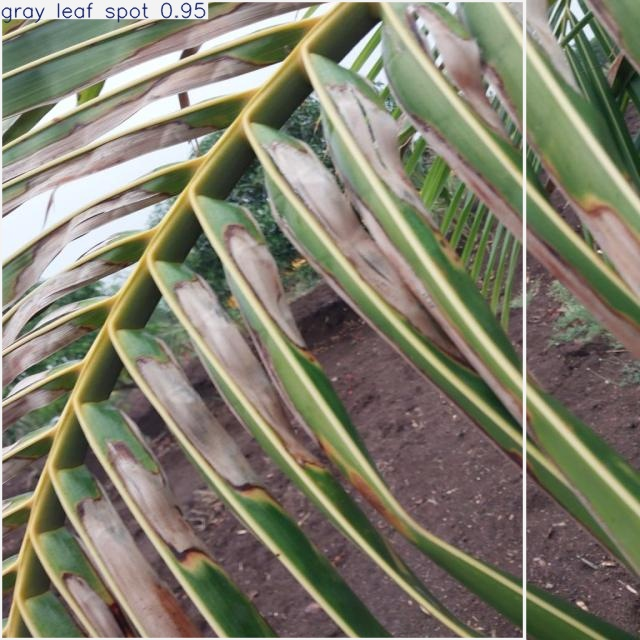

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, height=600))
      print("\n")

In [ ]:
!pip install opencv-python-headless matplotlib

In [ ]:
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 10.8 MB/s eta 0:00:00


In [ ]:
import numpy as np
import shap
import torch
import cv2
from matplotlib import pyplot as plt
from ultralytics import YOLO


In [ ]:
!pip install torchcam
!pip install YOLOv8-Explainer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38246 sha256=fb28697a07013b6f7e15cfe2838bff8390e4ad4d75202c3e3fb20e8d7b202965
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


Model summary: 225 layers, 3,011,823 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/coconut-tree-disease-8/train/images/BudRot328_jpg.rf.a2369513d7e320df4feab8597dea9ad7.jpg: 352x288 1 bud root dropping, 1 bud rot, 1 gray leaf spot, 56.4ms
Speed: 1.8ms preprocess, 56.4ms inference, 20.1ms postprocess per image at shape (1, 3, 352, 288)
The model detected 'bud rot' with 89.06% confidence.The highlighted regions (see heatmap) influenced this decision, indicating bud rot.
The model detected 'bud root dropping' with 41.22% confidence.The highlighted regions (see heatmap) influenced this decision, indicating bud root dropping.
The model detected 'gray leaf spot' with 27.70% confidence.The highlighted regions (see heatmap) influenced this decision, indicating gray leaf spot.


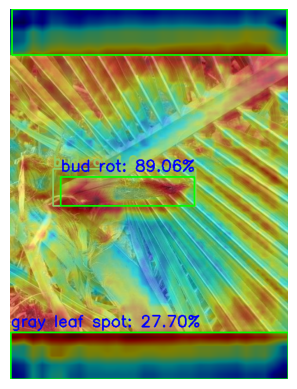

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from YOLOv8_Explainer import yolov8_heatmap
from PIL import Image

model_weight_path = "bestcoconutdisease.pt"

def yolov8_explainable_predictions(model2, img_path):
    imagelist = model2(img_path=img_path)

    image_with_heatmap = np.array(imagelist[0], dtype=np.uint8)

    model = YOLO(model_weight_path)

    results = model.predict(img_path)

    boxes = results[0].boxes
    class_names = results[0].names

    for box in boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        confidence = box.conf[0]
        class_id = int(box.cls[0])

        class_name = class_names[class_id]

        confidence_text = f"{class_name}: {confidence * 100:.2f}%"

        cv2.rectangle(image_with_heatmap, (x1, y1), (x2, y2), (0, 255, 0), 2)

        cv2.putText(image_with_heatmap, confidence_text, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

        explanation = f"The model detected '{class_name}' with {confidence * 100:.2f}% confidence.The highlighted regions (see heatmap) influenced this decision, indicating {class_name}."
        print(explanation)

    image_rgb = cv2.cvtColor(image_with_heatmap, cv2.COLOR_BGR2RGB)

    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

image_path = '/content/coconut-tree-disease-8/train/images/BudRot328_jpg.rf.a2369513d7e320df4feab8597dea9ad7.jpg'

model2 = yolov8_heatmap(
    weight=model_weight_path,
    conf_threshold=0.4,
    method="EigenCAM",
    layer=[10, 12, 14, 16, 18, -3],
    ratio=0.02,
    show_box=True,
    renormalize=False,
)

yolov8_explainable_predictions(model2, image_path)



image 1/1 /content/coconut-tree-disease-8/train/images/GrayLeafSpot1689_jpg.rf.c30091856fe64ed3712ec1fec32bbefa.jpg: 352x288 3 gray leaf spots, 8.2ms
Speed: 1.0ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 288)
The model detected 'gray leaf spot' with 91.79% confidence.The highlighted regions (see heatmap) influenced this decision, indicating gray leaf spot.
The model detected 'gray leaf spot' with 88.25% confidence.The highlighted regions (see heatmap) influenced this decision, indicating gray leaf spot.
The model detected 'gray leaf spot' with 78.18% confidence.The highlighted regions (see heatmap) influenced this decision, indicating gray leaf spot.


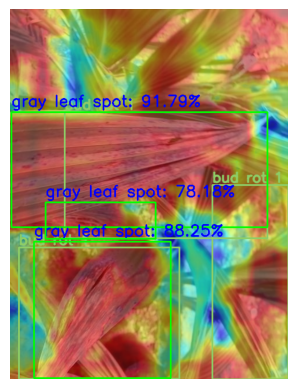

In [ ]:
image_path = '/content/coconut-tree-disease-8/train/images/GrayLeafSpot1689_jpg.rf.c30091856fe64ed3712ec1fec32bbefa.jpg'
yolov8_explainable_predictions(model2, image_path)



image 1/1 /content/coconut-tree-disease-8/train/images/LeafRot089_jpg.rf.b3403c2186463c39d1bc08c58a9880ca.jpg: 352x288 1 leaf rot, 9.3ms
Speed: 1.0ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 352, 288)
The model detected 'leaf rot' with 70.92% confidence.The highlighted regions (see heatmap) influenced this decision, indicating leaf rot.


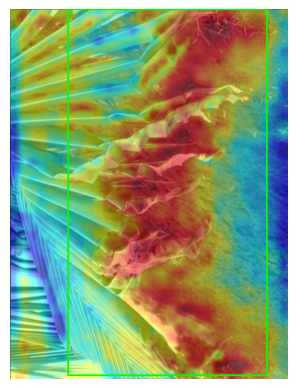

In [ ]:
image_path = '/content/coconut-tree-disease-8/train/images/LeafRot089_jpg.rf.b3403c2186463c39d1bc08c58a9880ca.jpg'
yolov8_explainable_predictions(model2, image_path)


image 1/1 /content/coconut-tree-disease-8/train/images/BudRootDropping356_jpg.rf.4bc4a718737eabed9373b73fe60c404d.jpg: 352x288 1 bud root dropping, 6.5ms
Speed: 0.9ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 288)
The model detected 'bud root dropping' with 86.97% confidence.The highlighted regions (see heatmap) influenced this decision, indicating bud root dropping.


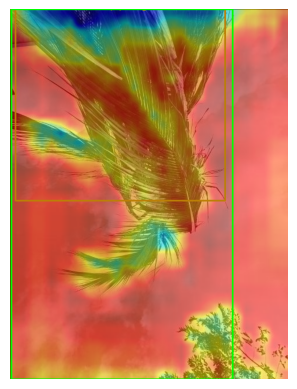

In [ ]:
image_path = '/content/coconut-tree-disease-8/train/images/BudRootDropping356_jpg.rf.4bc4a718737eabed9373b73fe60c404d.jpg'
yolov8_explainable_predictions(model2, image_path)


image 1/1 /content/coconut-tree-disease-8/valid/images/StemBleeding627_jpg.rf.b4c8bc43f9020acb3d99fdc46629d40b.jpg: 352x288 1 stembleeding, 6.5ms
Speed: 0.9ms preprocess, 6.5ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 288)
The model detected 'stembleeding' with 88.24% confidence.The highlighted regions (see heatmap) influenced this decision, indicating stembleeding.


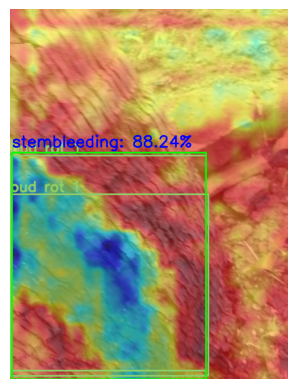

In [ ]:
image_path = '/content/coconut-tree-disease-8/valid/images/StemBleeding627_jpg.rf.b4c8bc43f9020acb3d99fdc46629d40b.jpg'
yolov8_explainable_predictions(model2, image_path)